ライブラリとファイルのインポート

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold
import evalml

In [2]:
df = pd.read_csv('data/example.csv')
df = df.iloc[:, 1:]
df.head()

,SMILES,_Name,MaxEStateIndex,MinEStateIndex,qed,MaxPartialCharge,MinPartialCharge,FpDensityMorgan1,FpDensityMorgan3,BalabanJ,...,VSA_EState9,FractionCSP3,MolLogP,MolMR,formation_HEAT,HOMO,LUMO,LUMO-HOMO,DIPOLE,LN(SOAC)
0,O=C1C=CC(=O)C=C1,1_4_benzoquinone,10.282778,-0.120741,0.416681,0.178413,-0.289961,0.750000,1.250000,2.826477,...,0.000000,0.000000,0.25060,28.2940,-28.37194,-10.556,-2.002,8.554,0.00018,-1.078810
1,Cc1c(C)c2c(c(C)c1O)CC(C)(C)O2,2_3_dihydro_22467_pentamethylbenzofuran_5_ol,9.965950,-0.140787,0.706652,0.126677,-0.507381,1.066667,2.266667,2.692578,...,0.000000,0.538462,3.03096,60.7288,-101.68499,-8.047,0.352,8.399,2.57703,0.538997
2,COc1c(O)cc(C)c(O)c1OC,2_3_dimethoxy_5_methyl_1_4_benzenediol,9.517824,-0.046620,0.682324,0.206777,-0.504146,1.076923,2.076923,3.412802,...,2.794444,0.333333,1.42342,47.6126,-147.22279,-8.498,-0.142,8.356,2.50890,-0.814508
3,Cc1c(O)ccc(O)c1C,2_3_dimethyl_1_4_benzenediol,9.113426,0.231759,0.535657,0.118517,-0.507672,0.900000,1.500000,3.342154,...,0.000000,0.250000,1.71464,39.2456,-81.91756,-8.523,0.027,8.550,1.27077,-0.904460
4,CC(C)(C)c1cc(C(C)(C)C)c(O)c(C(C)(C)C)c1,2_4_6_tritertbutylphenol,10.650222,-0.050255,0.673700,0.122542,-0.507341,0.631579,1.157895,3.676483,...,0.000000,0.666667,5.28470,84.2068,-91.82528,-8.480,0.472,8.952,1.63362,-5.463830


データの概要をつかむフェーズ(相関行列と散布図行列)
<br>動くのに時間がかかるのでコメントアウトして飛ばしてもよいかも

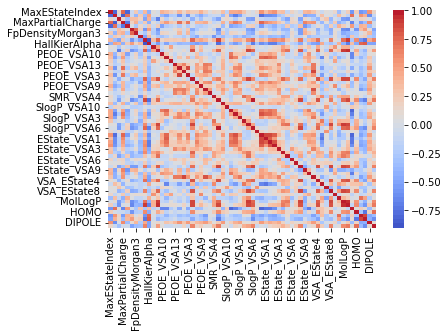

In [3]:
sns.heatmap(df.corr(), cmap=sns.color_palette('coolwarm', 50));

In [4]:
sns.pairplot(df, diag_kind='kde');

前もって削りたい列があればX.dropのcolumnsに追加する
<br>その後は分散と相関係数で変数スクリーニングのフェーズ

In [9]:
X = df.copy()
X.drop(columns=['_Name', 'SMILES','LN(SOAC)'], inplace=True)
y = df["LN(SOAC)"]
X

,MaxEStateIndex,MinEStateIndex,qed,MaxPartialCharge,MinPartialCharge,FpDensityMorgan1,FpDensityMorgan3,BalabanJ,BertzCT,HallKierAlpha,...,VSA_EState8,VSA_EState9,FractionCSP3,MolLogP,MolMR,formation_HEAT,HOMO,LUMO,LUMO-HOMO,DIPOLE
0,10.282778,-0.120741,0.416681,0.178413,-0.289961,0.750000,1.250000,2.826477,148.705216,-1.18,...,0.000000,0.000000,0.000000,0.25060,28.2940,-28.37194,-10.556,-2.002,8.554,0.00018
1,9.965950,-0.140787,0.706652,0.126677,-0.507381,1.066667,2.266667,2.692578,391.897473,-1.18,...,10.072661,0.000000,0.538462,3.03096,60.7288,-101.68499,-8.047,0.352,8.399,2.57703
2,9.517824,-0.046620,0.682324,0.206777,-0.504146,1.076923,2.076923,3.412802,319.881007,-1.58,...,1.663704,2.794444,0.333333,1.42342,47.6126,-147.22279,-8.498,-0.142,8.356,2.50890
3,9.113426,0.231759,0.535657,0.118517,-0.507672,0.900000,1.500000,3.342154,226.679658,-1.18,...,3.536481,0.000000,0.250000,1.71464,39.2456,-81.91756,-8.523,0.027,8.550,1.27077
4,10.650222,-0.050255,0.673700,0.122542,-0.507341,0.631579,1.157895,3.676483,426.929480,-0.98,...,19.583713,0.000000,0.666667,5.28470,84.2068,-91.82528,-8.480,0.472,8.952,1.63362
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,12.142874,-0.887671,0.434190,0.238289,-0.507678,0.818182,2.227273,2.377258,956.242683,-3.35,...,0.000000,0.000000,0.000000,1.98800,76.2440,-236.50178,-8.829,-1.197,7.632,3.10544
70,10.017680,-0.089670,0.725578,0.126509,-0.507381,1.062500,2.312500,2.649074,444.783943,-1.18,...,10.180291,0.000000,0.571429,3.42106,65.3458,-109.55595,-8.022,0.424,8.446,1.13185
71,10.817918,-0.128896,0.714221,0.122346,-0.507350,0.640000,1.240000,2.584152,719.705919,-1.96,...,16.726629,0.000000,0.478261,5.90044,105.8936,-119.15188,-8.278,0.162,8.440,3.19035
72,10.003634,-0.168673,0.657115,0.119367,-0.507638,0.687500,1.125000,3.397038,352.671973,-1.18,...,12.072948,0.000000,0.571429,3.69280,67.1716,-111.29693,-8.391,0.111,8.502,0.00046


In [10]:
sel = VarianceThreshold(threshold=0.05)
sel.fit(X)
X = X.loc[:, sel.get_support()]
print(X.shape)

(74, 58)


In [11]:
def select_corr(df, threshold=0.95):
    corr = abs(df.corr())
    columns = df.columns
    
    for i in range(len(columns)):
        corr.iloc[i, i] = 0
        
    while True:
        revised_column=corr.columns
        max_corr = 0
        query = None
        another = None
        
        max_search = corr.max()
        max_corr = max_search.max()
        query = max_search.idxmax()
        another = corr[query].idxmax()
        
        if max_corr < threshold:
            break
        else:
            delete = None
            save = None
            
            if sum(corr[query]) <= sum(corr[another]):
                delete = another
                save = query
            else:
                delete = query
                save = another
            print(delete)
            corr.drop([delete], axis=0, inplace=True)
            corr.drop([delete], axis=1, inplace=True)
            df.drop([delete], axis=1, inplace=True)
    
    return df

In [12]:
select_corr(X, threshold=0.95)
X = X.loc[:, X.columns]
print(X.shape)

SMR_VSA7
(74, 57)


データ分割と標準化
<br>test_size=0.2くらいが標準の相場,もっと減らしてもよい

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 41)

In [14]:
sc = StandardScaler()
X_train = pd.DataFrame(sc.fit_transform(X_train), columns=X_train.columns, index=X_train.index)
X_test = pd.DataFrame(sc.transform(X_test), columns=X_test.columns, index=X_test.index)

EvalMLを動かして最も結果の良かったモデルを示す

In [15]:
from evalml.automl import AutoMLSearch
automl = AutoMLSearch(X_train=X_train, y_train=y_train, problem_type='regression', objective='root mean squared error', 
                      additional_objectives=['mae', 'r2'], max_iterations=100, ensembling=True, 
                      random_seed=41, n_jobs=-1, verbose=True)
automl.search()


*****************************
* Beginning pipeline search *
*****************************

Optimizing for Root Mean Squared Error. 
Lower score is better.

Using SequentialEngine to train and score pipelines.
Searching up to 100 pipelines. 
Allowed model families: 



FigureWidget({
    'data': [{'mode': 'lines+markers',
              'name': 'Best Score',
              'type'…

Evaluating Baseline Pipeline: Mean Baseline Regression Pipeline
Mean Baseline Regression Pipeline:
	Starting cross validation
	Finished cross validation - mean Root Mean Squared Error: 4.097

*****************************
* Evaluating Batch Number 1 *
*****************************



/Users/goazumahiroaki/.conda/envs/lecture-beginner/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.312e+00, tolerance: 5.686e-02

/Users/goazumahiroaki/.conda/envs/lecture-beginner/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.212e+00, tolerance: 6.774e-02



Elastic Net Regressor w/ Imputer + Standard Scaler:
	Starting cross validation
	Finished cross validation - mean Root Mean Squared Error: 11.329


/Users/goazumahiroaki/.conda/envs/lecture-beginner/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.572e+00, tolerance: 5.148e-02



Random Forest Regressor w/ Imputer:
	Starting cross validation
	Finished cross validation - mean Root Mean Squared Error: 2.247

*****************************
* Evaluating Batch Number 2 *
*****************************



/Users/goazumahiroaki/.conda/envs/lecture-beginner/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.073e+01, tolerance: 5.686e-02

/Users/goazumahiroaki/.conda/envs/lecture-beginner/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.453e+01, tolerance: 6.774e-02



Elastic Net Regressor w/ Imputer + Standard Scaler + RF Regressor Select From Model:
	Starting cross validation
	Finished cross validation - mean Root Mean Squared Error: 6.318


/Users/goazumahiroaki/.conda/envs/lecture-beginner/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.774e+01, tolerance: 5.148e-02



Random Forest Regressor w/ Imputer + RF Regressor Select From Model:
	Starting cross validation
	Finished cross validation - mean Root Mean Squared Error: 2.248

*****************************
* Evaluating Batch Number 3 *
*****************************

Decision Tree Regressor w/ Imputer + Select Columns Transformer:
	Starting cross validation
	Finished cross validation - mean Root Mean Squared Error: 2.527
Extra Trees Regressor w/ Imputer + Select Columns Transformer:
	Starting cross validation
	Finished cross validation - mean Root Mean Squared Error: 2.196
XGBoost Regressor w/ Imputer + Select Columns Transformer:
	Starting cross validation
	Finished cross validation - mean Root Mean Squared Error: 2.395
CatBoost Regressor w/ Imputer + Select Columns Transformer:
	Starting cross validation
	Finished cross validation - mean Root Mean Squared Error: 3.839
LightGBM Regressor w/ Imputer + Select Columns Transformer:
	Starting cross validation
	Finished cross validation - mean Root Mean S

	Finished cross validation - mean Root Mean Squared Error: 2.560
Extra Trees Regressor w/ Imputer + Select Columns Transformer:
	Starting cross validation
	Finished cross validation - mean Root Mean Squared Error: 2.409
Random Forest Regressor w/ Imputer + Select Columns Transformer:
	Starting cross validation
	Finished cross validation - mean Root Mean Squared Error: 2.192
XGBoost Regressor w/ Imputer + Select Columns Transformer:
	Starting cross validation
	Finished cross validation - mean Root Mean Squared Error: 2.893
Extra Trees Regressor w/ Imputer + Select Columns Transformer:
	Starting cross validation
	Finished cross validation - mean Root Mean Squared Error: 2.357
Random Forest Regressor w/ Imputer + Select Columns Transformer:
	Starting cross validation
	Finished cross validation - mean Root Mean Squared Error: 2.191
XGBoost Regressor w/ Imputer + Select Columns Transformer:
	Starting cross validation
	Finished cross validation - mean Root Mean Squared Error: 2.595
Extra Tre

In [16]:
automl.rankings

,id,pipeline_name,search_order,mean_cv_score,standard_deviation_cv_score,validation_score,percent_better_than_baseline,high_variance_cv,parameters
0,50,Extra Trees Regressor w/ Imputer + Select Colu...,50,2.155622,0.516901,2.155622,47.379618,False,{'Imputer': {'categorical_impute_strategy': 'm...
5,45,Random Forest Regressor w/ Imputer + Select Co...,45,2.183442,0.455740,2.183442,46.700521,False,{'Imputer': {'categorical_impute_strategy': 'm...
36,2,Random Forest Regressor w/ Imputer,2,2.246993,0.494013,2.246993,45.149194,False,{'Imputer': {'categorical_impute_strategy': 'm...
37,4,Random Forest Regressor w/ Imputer + RF Regres...,4,2.247966,0.458459,2.247966,45.125446,False,{'Imputer': {'categorical_impute_strategy': 'm...
60,7,XGBoost Regressor w/ Imputer + Select Columns ...,7,2.395463,0.111911,2.395463,41.524933,False,{'Imputer': {'categorical_impute_strategy': 'm...
67,10,Stacked Ensemble Regression Pipeline,10,2.447587,0.062840,2.447587,40.252535,False,{'Linear Pipeline - Imputer': {'categorical_im...
73,5,Decision Tree Regressor w/ Imputer + Select Co...,5,2.526575,0.357635,2.526575,38.324378,False,{'Imputer': {'categorical_impute_strategy': 'm...
95,8,CatBoost Regressor w/ Imputer + Select Columns...,8,3.839461,0.633954,3.839461,6.275837,False,{'Imputer': {'categorical_impute_strategy': 'm...
96,9,LightGBM Regressor w/ Imputer + Select Columns...,9,3.963369,0.399934,3.963369,3.251144,False,{'Imputer': {'categorical_impute_strategy': 'm...
97,0,Mean Baseline Regression Pipeline,0,4.096554,0.587701,4.096554,0.000000,False,{'Baseline Regressor': {'strategy': 'mean'}}


In [17]:
best_pipeline = automl.best_pipeline
automl.describe_pipeline(automl.rankings.iloc[0]["id"])


*****************************************************************
* Extra Trees Regressor w/ Imputer + Select Columns Transformer *
*****************************************************************

Problem Type: regression
Model Family: Extra Trees

Pipeline Steps
1. Imputer
	 * categorical_impute_strategy : most_frequent
	 * numeric_impute_strategy : mean
	 * categorical_fill_value : None
	 * numeric_fill_value : None
2. Select Columns Transformer
	 * columns : ['FpDensityMorgan3', 'BalabanJ', 'Ipc', 'Kappa2', 'PEOE_VSA10', 'PEOE_VSA7', 'PEOE_VSA8', 'SlogP_VSA1', 'SlogP_VSA2', 'SlogP_VSA4', 'SlogP_VSA5', 'SlogP_VSA6', 'EState_VSA10', 'EState_VSA2', 'EState_VSA4', 'EState_VSA5', 'EState_VSA7', 'EState_VSA8', 'EState_VSA9', 'VSA_EState4', 'VSA_EState5', 'VSA_EState6', 'VSA_EState8', 'FractionCSP3', 'MolLogP', 'formation_HEAT', 'HOMO', 'LUMO-HOMO', 'DIPOLE']
3. Extra Trees Regressor
	 * n_estimators : 411
	 * max_features : auto
	 * max_depth : 6
	 * min_samples_split : 2
	 * min_weigh

In [18]:
best_pipeline.score(X_test, y_test, objectives=['root mean squared error', 'mae', 'r2'])

OrderedDict([('Root Mean Squared Error', 2.426737815241342),
             ('MAE', 1.9032522496433195),
             ('R2', 0.6464849094386569)])

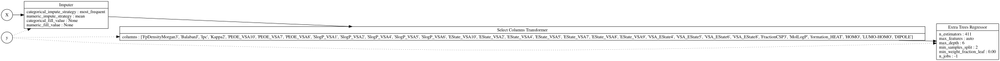

In [19]:
best_pipeline.graph()

In [20]:
from evalml.model_understanding import graph_prediction_vs_actual
y_pred = best_pipeline.predict(X_test)
y_predtrain = best_pipeline.predict(X_train)
graph_prediction_vs_actual(y_test, y_pred)

In [21]:
graph_prediction_vs_actual(y_train, y_predtrain)

In [22]:
from evalml.model_understanding.graphs import graph_permutation_importance
graph_permutation_importance(best_pipeline, X_train, y_train, 'root mean squared error')

ModuleNotFoundError: No module named 'evalml.model_understanding.graphs'

In [23]:
from evalml.model_understanding.permutation_importance import calculate_permutation_importance
df_imp = calculate_permutation_importance(best_pipeline, X_train, y_train, 'root mean squared error', n_jobs=-1)
df_imp[:10]

,feature,importance
0,HOMO,1.077446
1,SlogP_VSA6,0.627659
2,Kappa2,0.374499
3,SlogP_VSA4,0.311256
4,PEOE_VSA10,0.280602
5,EState_VSA2,0.231756
6,LUMO-HOMO,0.198276
7,PEOE_VSA8,0.171181
8,MolLogP,0.159378
9,EState_VSA4,0.148883


以下、選ばれたモデルいよってはバグります。分類問題の時もバグります

In [24]:
from evalml.model_understanding.prediction_explanations.explainers import explain_predictions
explain_predictions(best_pipeline, X_train, y_train, indices_to_explain=[0], include_explainer_values=True, include_expected_value=True, 
                    top_k_features=7, output_format='dataframe', algorithm='shap')

,feature_names,feature_values,qualitative_explanation,quantitative_explanation,prediction_number
0,HOMO,0.720320,++,1.326105,0
1,VSA_EState4,0.854684,+,0.185240,0
2,EState_VSA2,-0.364038,+,0.163133,0
3,PEOE_VSA10,-0.059895,-,-0.174077,0
4,Kappa2,-0.855844,-,-0.196511,0
5,SlogP_VSA4,-0.743608,-,-0.237558,0
6,SlogP_VSA6,-0.323973,-,-0.391363,0


In [25]:
from evalml.model_understanding.force_plots import graph_force_plot

rows_to_explain = [0]

results = graph_force_plot(best_pipeline, rows_to_explain=rows_to_explain,
                           training_data=X_train, y=y_train)

for result in results:
    for cls in result:
        display(result[cls]["plot"])